# Libraries to be installed
!pip install opencv-python matplotlib numpy pandas seaborn scikit-learn tensorflow


In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical

from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd


C:\Users\Shahab\anaconda3\envs\myenv\lib\site-packages\h5py\__init__.py:36: UserWarning: h5py is running against HDF5 1.14.5 when it was built against 1.14.6, this may cause problems
  _warn(("h5py is running against HDF5 {0} when it was built against {1}, "


# Import Required Libraries
This cell imports all necessary Python libraries for image processing, data handling, visualization, model building, and evaluation. Libraries like TensorFlow and Keras are used for building the deep learning model, while libraries like OpenCV, matplotlib, seaborn, and sklearn help with preprocessing, visualization, and evaluation.

# Step 2: Define Paths


In [2]:
base_dir = r'C:\Users\Shahab\OneDrive\Desktop\plant health detector\Total Dataset 2 Classes'
train_dir = os.path.join(base_dir, 'Augmented data')
val_dir = os.path.join(base_dir, 'UnAugmented data')
test_dir = os.path.join(base_dir, 'test_images')


# Set Dataset Paths
Here, the base directory containing the dataset is defined. The dataset is divided into three folders:

Augmented data for training,

UnAugmented data for validation,

test_images for final testing.


# Step 3: Visualize Sample Images

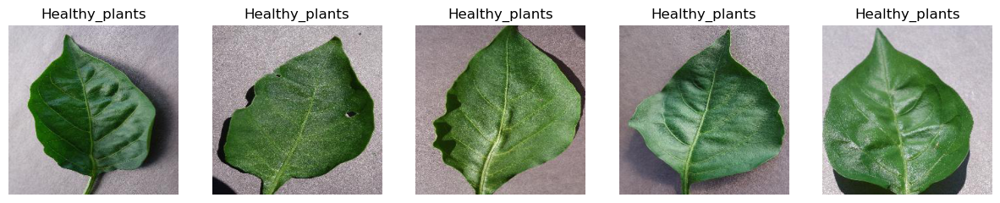

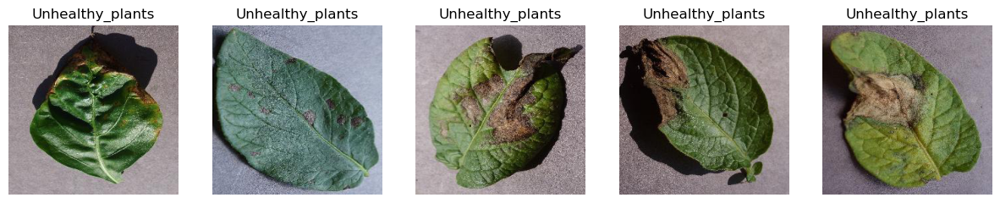

In [5]:
def show_sample_images(directory, category, num_images=5):
    folder = os.path.join(directory, category)
    images = os.listdir(folder)[:num_images]

    plt.figure(figsize=(15, 5))
    for i, image_name in enumerate(images):
        image_path = os.path.join(folder, image_name)
        img = plt.imread(image_path)
        plt.subplot(1, num_images, i+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(category)
    plt.show()

show_sample_images(train_dir, 'Healthy_plants')
show_sample_images(train_dir, 'Unhealthy_plants')


# 3: Display Sample Images
This function displays sample images from the dataset for a given category (e.g., "Healthy_plants" or "Unhealthy_plants"). It helps you visually confirm that the dataset is loaded correctly.

# Step 4: Create Image Generators (with Augmentation for Training)

In [4]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    zoom_range=0.2,
    horizontal_flip=True,
    width_shift_range=0.1,
    height_shift_range=0.1
)

val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)


# Set Up Image Preprocessing
Image preprocessing is done using ImageDataGenerator. For training images, various augmentations (like rotation, zoom, flipping, shifting) are applied to help generalize the model. Validation and test images are only rescaled to normalize pixel values.

# Step 5: Load Data from Folders

In [5]:
img_size = (128, 128)
batch_size = 32

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)


Found 1088 images belonging to 2 classes.
Found 1088 images belonging to 2 classes.
Found 481 images belonging to 2 classes.


# Create Data Generators
This block creates training, validation, and test generators that load images in batches from their respective directories, resize them to 128x128 pixels, and convert labels into categorical format (one-hot encoding).


# Step 6: Preview Augmented Images

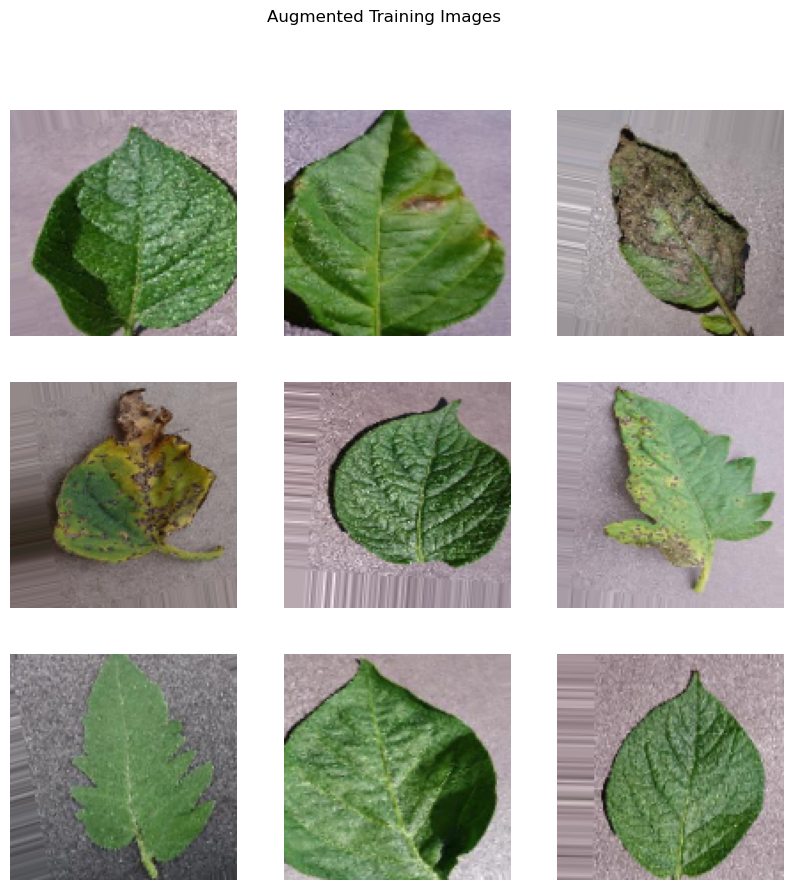

In [8]:
# View some augmented training images
images, labels = next(train_generator)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(images[i])
    plt.axis('off')
plt.suptitle('Augmented Training Images')
plt.show()


# 6: Visualize Augmented Images
This block visualizes a few augmented training images to ensure that the augmentation process is working properly and producing reasonable variations of the input images.

# Phase 1: Build & Train CNN Model

## step 1: Define the Model

In [9]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D(2, 2),

    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),

    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(2, activation='softmax')  # 2 classes (healthy and unhealthy)
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


C:\Users\Shahab\anaconda3\envs\myenv\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 2)                   │             258 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,304,898 (12.61 MB)

 Trainable params: 3,304,898 (12.61 MB)

 Non-trainable params: 0 (0.00 B)

# Build the CNN Model
A Convolutional Neural Network (CNN) is defined using Keras Sequential API. The model has:

3 convolutional layers (with increasing filters),

Max pooling after each conv layer,

Flattening layer,

Dense layer with ReLU activation,

Dropout for regularization,

Final softmax output layer for binary classification (healthy vs. unhealthy).

The model is compiled using the Adam optimizer and categorical crossentropy loss.

## Step 2: Train the Model

In [10]:
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=val_generator
)


C:\Users\Shahab\anaconda3\envs\myenv\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
34/34 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - accuracy: 0.5126 - loss: 0.7563 - val_accuracy: 0.5239 - val_loss: 0.6978
Epoch 2/10
34/34 ━━━━━━━━━━━━━━━━━━━━ 31s 916ms/step - accuracy: 0.5526 - loss: 0.6756 - val_accuracy: 0.7289 - val_loss: 0.5352
Epoch 3/10
34/34 ━━━━━━━━━━━━━━━━━━━━ 30s 891ms/step - accuracy: 0.7437 - loss: 0.5261 - val_accuracy: 0.8070 - val_loss: 0.3987
Epoch 4/10
34/34 ━━━━━━━━━━━━━━━━━━━━ 29s 850ms/step - accuracy: 0.8266 - loss: 0.4084 - val_accuracy: 0.8153 - val_loss: 0.3752
Epoch 5/10
34/34 ━━━━━━━━━━━━━━━━━━━━ 30s 872ms/step - accuracy: 0.8457 - loss: 0.3417 - val_accuracy: 0.8594 - val_loss: 0.3048
Epoch 6/10
34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 859ms/step - accuracy: 0.8738 - loss: 0.3199 - val_accuracy: 0.8934 - val_loss: 0.2408
Epoch 7/10
34/34 ━━━━━━━━━━━━━━━━━━━━ 30s 870ms/step - accuracy: 0.8765 - loss: 0.3138 - val_accuracy: 0.9256 - val_loss: 0.2134
Epoch 8/10
34/34 ━━━━━━━━━━━━━━━━━━━━ 29s 855ms/step - accuracy: 0.9195 - loss: 0.2358 - val_accurac

# Train the Model
This block trains the CNN on the training data and validates it on the validation set for 10 epochs. Training progress (loss and accuracy) is tracked.

# Phase 2: Evaluate Performance

## Step 1: Plot Accuracy & Loss

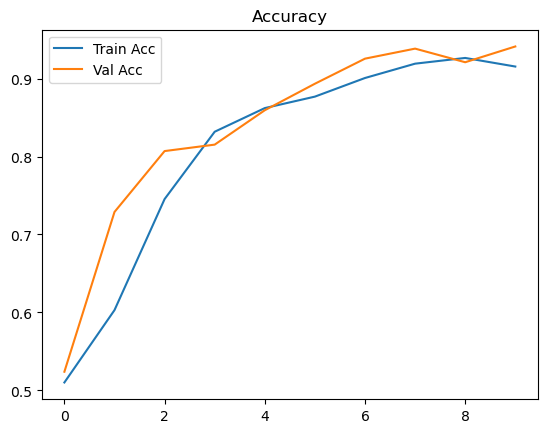

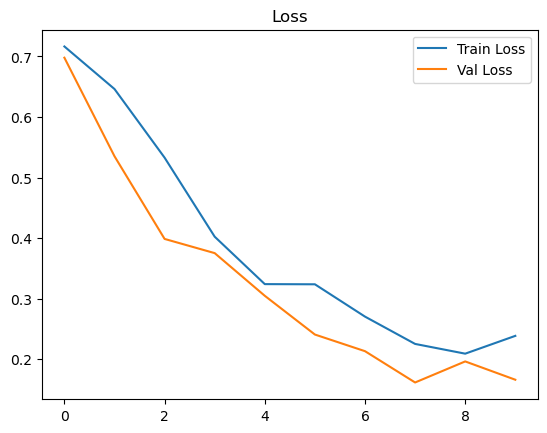

In [11]:
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Loss')
plt.legend()
plt.show()


# Plot Training and Validation Accuracy
This block plots training and validation accuracy over epochs, helping to understand how well the model is learning and whether it's overfitting or underfitting.


# Plot Training and Validation Loss
Similarly, this block plots training and validation loss over epochs to visualize the model's learning performance.

## Step 2: Evaluate on Test Set

In [12]:
loss, acc = model.evaluate(test_generator)
print(f"Test Accuracy: {acc*100:.2f}%")


16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 224ms/step - accuracy: 0.9249 - loss: 0.1883
Test Accuracy: 92.10%


#  Evaluate Model on Test Data
After training, this block evaluates the model’s performance on the test dataset and prints the final accuracy.

## Step 3: Confusion Matrix



16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 224ms/step


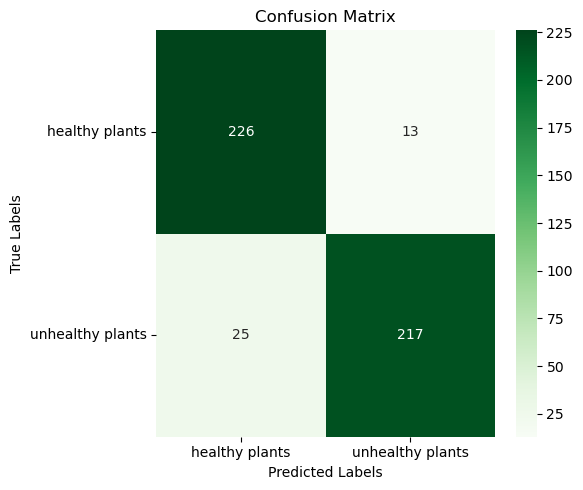

Classification Report:
                  precision    recall  f1-score   support

  healthy plants       0.90      0.95      0.92       239
unhealthy plants       0.94      0.90      0.92       242

        accuracy                           0.92       481
       macro avg       0.92      0.92      0.92       481
    weighted avg       0.92      0.92      0.92       481



In [14]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Reset test generator
test_generator.reset()

# Get predictions
preds = model.predict(test_generator)
y_pred = np.argmax(preds, axis=1)         # Predicted labels
y_true = test_generator.classes            # True labels

# Define binary class names
class_labels = ['healthy plants', 'unhealthy plants']

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cmap="Greens")
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_labels))


# Predict and Show Evaluation Metrics
This block:

Uses the trained model to predict classes on the test dataset.

Converts the predictions into class labels.

Computes and visualizes the confusion matrix.

Prints a classification report, which includes precision, recall, f1-score, and support for each class.

# Phase 3: Real-Time Prediction (Webcam / Video / Image)

## Step 1: Save Model

In [ ]:
model.save("plant_health_detection_model1.h5")


In [10]:
"""using the saved model"""

'using the saved model'

In [3]:

from tensorflow.keras.models import load_model

# Load the model from file
model = load_model("plant_health_detection_model1.h5")


# Load the Trained Model
This section loads a previously saved Keras model (plant_health_detection_model1.h5) from disk. The model was trained earlier to classify plant leaves as either Healthy or Unhealthy.

## Step 2: Real-Time Webcam Detection Script

In [8]:
import cv2
import numpy as np
import tkinter as tk
from tkinter import messagebox
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array

# Load the trained model
model = load_model("plant_health_detection_model1.h5")

# Class labels
class_labels = ['Healthy_plant', 'Unhealthy_plant']

# Image size expected by the model
IMG_SIZE = 128

# Real-time detection function
def start_detection():
    cap = cv2.VideoCapture(0)

    if not cap.isOpened():
        messagebox.showerror("Error", "❌ Camera could not be opened")
        return

    messagebox.showinfo("Info", "✅ Press 'Esc' to exit real-time detection")

    while True:
        ret, frame = cap.read()
        if not ret:
            print("❌ Failed to read frame")
            break

        # Resize and preprocess the frame
        roi = cv2.resize(frame, (IMG_SIZE, IMG_SIZE))
        roi = img_to_array(roi) / 255.0
        roi = np.expand_dims(roi, axis=0)

        # Predict
        preds = model.predict(roi)
        pred_index = np.argmax(preds)
        label = class_labels[pred_index]
        confidence = preds[0][pred_index] * 100

        # Display result on the frame
        color = (0, 255, 0) if label == 'Healthy_plant' else (0, 0, 255)
        cv2.putText(frame, f"{label} ({confidence:.2f}%)", (10, 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)

        cv2.imshow("Plant Health Detection", frame)

        # Exit if 'Esc' is pressed
        if cv2.waitKey(1) & 0xFF == 27:  # 27 = ESC key
            break

    cap.release()
    cv2.destroyAllWindows()

# GUI setup
def launch_gui():
    root = tk.Tk()
    root.title("Plant Detection")
    root.geometry("300x200")
    root.configure(bg="#d0f0c0")

    tk.Label(root, text="Plant Detection", font=("Helvetica", 16, "bold"), bg="#d0f0c0").pack(pady=20)

    tk.Button(root, text="Start Real-Time Detection", font=("Helvetica", 12), command=start_detection).pack(pady=10)
    tk.Button(root, text="Exit", font=("Helvetica", 12), command=root.destroy).pack(pady=10)

    root.mainloop()

# Start GUI
launch_gui()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━

# Import Libraries for Real-Time Detection and GUI
Here, additional libraries are imported:

cv2 for camera and image handling,

tkinter for creating a simple GUI,

numpy for array processing,

img_to_array for preprocessing image frames to the format expected by the model.

# Real-Time Detection Function
This function captures live video from your computer's webcam. For each frame:

It resizes and preprocesses the frame.

The frame is passed to the model for prediction.

The model outputs the predicted class and confidence.

The prediction is overlaid on the video feed (green for healthy, red for unhealthy).

The user can press Esc to exit the detection loop.

If the camera can't be opened, an error message is shown using a Tkinter message box.

# GUI for Detection
This part creates a simple graphical user interface (GUI) using tkinter. It has:

A title label "Plant Detection",

A button to start real-time detection,

An exit button to close the GUI.

Clicking "Start Real-Time Detection" runs the detection loop described above.

## Show Predictions on Test Images

C:\Users\Shahab\anaconda3\envs\myenv\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 300ms/step


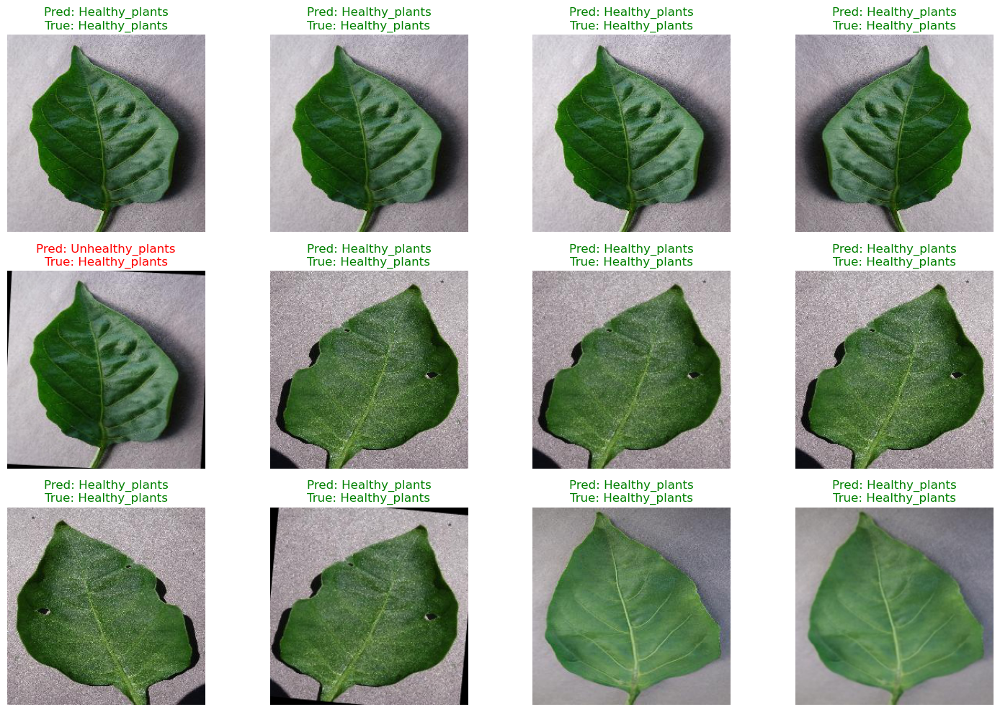

In [12]:
# Reset generator to start from the beginning
test_generator.reset()

# Get predictions
preds = model.predict(test_generator)
predicted_classes = np.argmax(preds, axis=1)
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Get file paths
file_paths = test_generator.filepaths

# Display N sample results with images
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def show_predictions(n=12):
    plt.figure(figsize=(15, 10))
    for i in range(n):
        img = mpimg.imread(file_paths[i])
        plt.subplot(3, 4, i+1)
        plt.imshow(img)
        plt.axis('off')
        pred_label = class_labels[predicted_classes[i]]
        true_label = class_labels[true_classes[i]]
        color = 'green' if pred_label == true_label else 'red'
        plt.title(f"Pred: {pred_label}\nTrue: {true_label}", color=color)
    plt.tight_layout()
    plt.show()

show_predictions(12)  # You can increase to 20, 30, etc.


# Predict on Test Dataset
Once the model is loaded, this part:

Resets the test data generator to start from the beginning,

Uses the model to predict the classes of all test images,

Converts predictions and true labels to class indices,

Retrieves file paths for displaying results later.

# Show Sample Predictions with Images
This function displays sample test images along with predicted and true labels. It:

Shows 12 images by default,

Colors the title green if the prediction is correct, or red if incorrect.

The function helps visualize how well the model performs on actual data.

16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 223ms/step


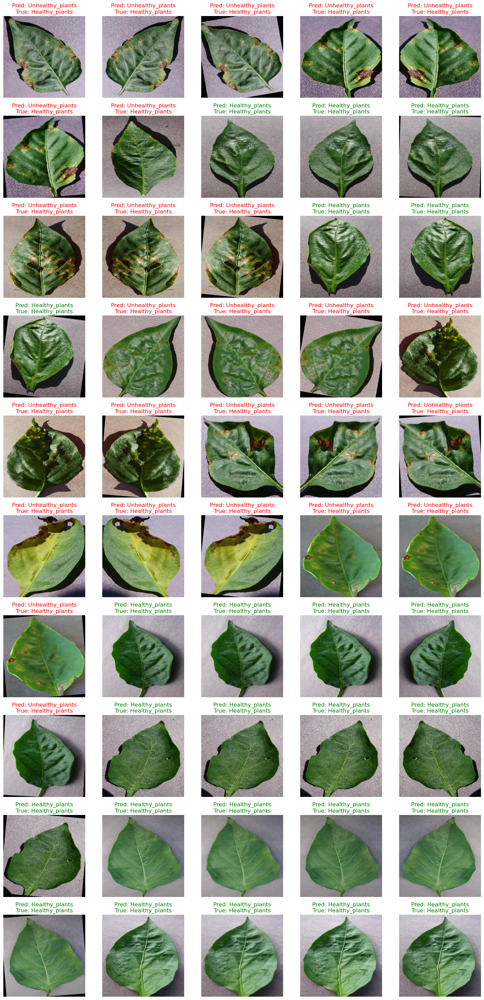

In [21]:
# changed code !!
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Reset generator to start from the beginning
test_generator.reset()

# Get predictions
preds = model.predict(test_generator)
predicted_classes = np.argmax(preds, axis=1)
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())
file_paths = test_generator.filepaths

# Function to show predictions
def show_predictions(n=12):
    # Make sure n doesn't exceed available test images
    n = min(n, len(file_paths))

    # Calculate rows and columns based on n
    cols = 5  # You can change this to any number like 4 or 6
    rows = int(np.ceil(n / cols))

    plt.figure(figsize=(cols * 3, rows * 3))

    for i in range(n):
        img = mpimg.imread(file_paths[i])
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis('off')
        pred_label = class_labels[predicted_classes[i]]
        true_label = class_labels[true_classes[i]]
        color = 'green' if pred_label == true_label else 'red'
        plt.title(f"Pred: {pred_label}\nTrue: {true_label}", color=color)

    plt.tight_layout()
    plt.show()

# Call the function
show_predictions(50)


# Improved Version of Prediction Display
This updated version of the previous prediction viewer includes:

Automatic adjustment of subplot rows and columns based on the number of images (n),

Cleaner and more scalable layout using cols = 5 and dynamic rows,

Ensures n doesn’t exceed available images.

This version is more flexible and better for viewing large numbers of predictions (e.g., 50 images).

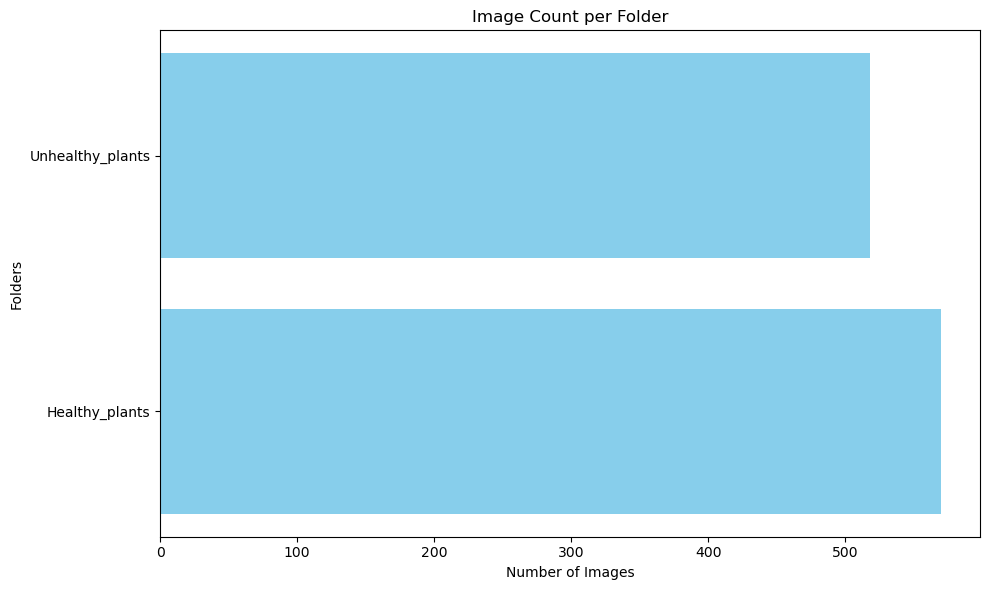

In [6]:
import os
import matplotlib.pyplot as plt

# Supported image extensions
image_extensions = ('.jpg', '.jpeg', '.png')

# Dictionary to hold folder names and image counts
image_counts = {}

# Root directory to scan (change '.' to your desired path)
root_dir = './UnAugmented Data'

# Walk through directories
for root, dirs, files in os.walk(root_dir):
    # Filter image files
    image_files = [f for f in files if f.lower().endswith(image_extensions)]
    
    # If there are images, store the count
    if image_files:
        folder_name = os.path.relpath(root, root_dir)
        image_counts[folder_name] = len(image_files)

# Plotting
folders = list(image_counts.keys())
counts = list(image_counts.values())

plt.figure(figsize=(10, 6))
plt.barh(folders, counts, color='skyblue')
plt.xlabel("Number of Images")
plt.ylabel("Folders")
plt.title("Image Count per Folder")
plt.tight_layout()
plt.show()


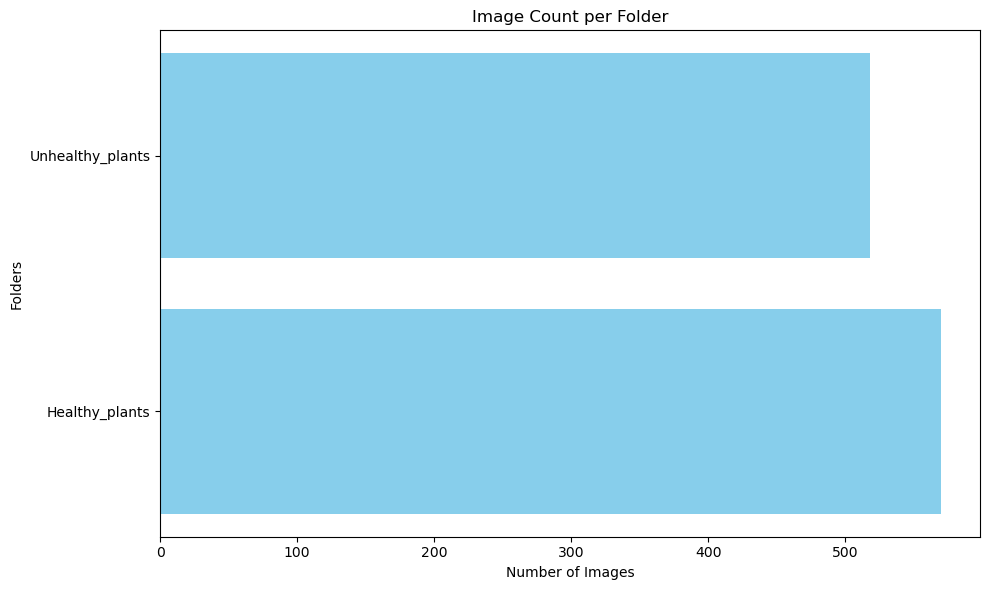

In [7]:
import os
import matplotlib.pyplot as plt

# Supported image extensions
image_extensions = ('.jpg', '.jpeg', '.png')

# Dictionary to hold folder names and image counts
image_counts = {}

# Root directory to scan (change '.' to your desired path)
root_dir = './Augmented Data'

# Walk through directories
for root, dirs, files in os.walk(root_dir):
    # Filter image files
    image_files = [f for f in files if f.lower().endswith(image_extensions)]
    
    # If there are images, store the count
    if image_files:
        folder_name = os.path.relpath(root, root_dir)
        image_counts[folder_name] = len(image_files)

# Plotting
folders = list(image_counts.keys())
counts = list(image_counts.values())

plt.figure(figsize=(10, 6))
plt.barh(folders, counts, color='skyblue')
plt.xlabel("Number of Images")
plt.ylabel("Folders")
plt.title("Image Count per Folder")
plt.tight_layout()
plt.show()
